In [1]:
from google.colab import files
files.upload()


Saving appointments.csv to appointments.csv


{'appointments.csv': b'PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,OnGovtWelfareBenefits,Hypertension,Diabetes,Alcoholism,Handicapped,SMS_received,No-show\n29872499824296,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No\n558997776694438,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No\n4262962299951,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No\n867951213174,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No\n8841186448183,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No\n95985133231274,5626772,F,2016-04-27T08:36:51Z,2016-04-29T00:00:00Z,76,REP\xc3\x9aBLICA,0,1,0,0,0,0,No\n733688164476661,5630279,F,2016-04-27T15:05:12Z,2016-04-29T00:00:00Z,23,GOIABEIRAS,0,0,0,0,0,0,Yes\n3449833394123,5630575,F,2016-04-27T15:39:58Z,2016-04-29T00:00:00Z,39,GOIABEIRAS,0,0,0,0,0,0,Yes\n563947

In [3]:
import pandas as pd

df = pd.read_csv("/content/appointments.csv")
df.head()


,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,OnGovtWelfareBenefits,Hypertension,Diabetes,Alcoholism,Handicapped,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29T18:38:08Z,2016-04-29T00:00:00Z,62,JARDIM DA PENHA,0,1,0,0,0,0,No
1,5.589978e+14,5642503,M,2016-04-29T16:08:27Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,0,0,0,0,0,No
2,4.262962e+12,5642549,F,2016-04-29T16:19:04Z,2016-04-29T00:00:00Z,62,MATA DA PRAIA,0,0,0,0,0,0,No
3,8.679512e+11,5642828,F,2016-04-29T17:29:31Z,2016-04-29T00:00:00Z,8,PONTAL DE CAMBURI,0,0,0,0,0,0,No
4,8.841186e+12,5642494,F,2016-04-29T16:07:23Z,2016-04-29T00:00:00Z,56,JARDIM DA PENHA,0,1,1,0,0,0,No


In [4]:
df.shape


(110527, 14)

In [5]:
df.columns


Index(['PatientId', 'AppointmentID', 'Gender', 'ScheduledDay',
       'AppointmentDay', 'Age', 'Neighbourhood', 'OnGovtWelfareBenefits',
       'Hypertension', 'Diabetes', 'Alcoholism', 'Handicapped', 'SMS_received',
       'No-show'],
      dtype='object')

In [6]:
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110527 entries, 0 to 110526
Data columns (total 14 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   PatientId              110527 non-null  float64
 1   AppointmentID          110527 non-null  int64  
 2   Gender                 110527 non-null  object 
 3   ScheduledDay           110527 non-null  object 
 4   AppointmentDay         110527 non-null  object 
 5   Age                    110527 non-null  int64  
 6   Neighbourhood          110527 non-null  object 
 7   OnGovtWelfareBenefits  110527 non-null  int64  
 8   Hypertension           110527 non-null  int64  
 9   Diabetes               110527 non-null  int64  
 10  Alcoholism             110527 non-null  int64  
 11  Handicapped            110527 non-null  int64  
 12  SMS_received           110527 non-null  int64  
 13  No-show                110527 non-null  object 
dtypes: float64(1), int64(8), object(5)
m

In [7]:
df.isna().sum().sort_values(ascending=False)


,0
PatientId,0
AppointmentID,0
Gender,0
ScheduledDay,0
AppointmentDay,0
Age,0
Neighbourhood,0
OnGovtWelfareBenefits,0
Hypertension,0
Diabetes,0


In [10]:
df["No-show"].value_counts()
df["No-show"].value_counts(normalize=True)


,proportion
No-show,
No,0.798067
Yes,0.201933


In [11]:
df["Age"].describe()
(df["Age"] < 0).sum(), (df["Age"] > 110).sum()
df.loc[df["Age"] < 0, "Age"].value_counts().head()
df.loc[df["Age"] > 110, "Age"].value_counts().head()


,count
Age,
115,5


In [12]:
df["Handicapped"].value_counts().head(20)
df["Handicapped"].describe()


,Handicapped
count,110527.000000
mean,0.022248
std,0.161543
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,4.000000


In [13]:
df["Neighbourhood"].nunique()
df["Neighbourhood"].value_counts().head(10)


,count
Neighbourhood,
JARDIM CAMBURI,7717
MARIA ORTIZ,5805
RESISTÊNCIA,4431
JARDIM DA PENHA,3877
ITARARÉ,3514
CENTRO,3334
TABUAZEIRO,3132
SANTA MARTHA,3131
JESUS DE NAZARETH,2853


In [14]:
df["ScheduledDay"] = pd.to_datetime(df["ScheduledDay"], utc=True)
df["AppointmentDay"] = pd.to_datetime(df["AppointmentDay"], utc=True)

lead_hours = (df["AppointmentDay"] - df["ScheduledDay"]).dt.total_seconds()/3600
lead_days = lead_hours/24

lead_days.describe()
(lead_days < 0).sum()
lead_days.nsmallest(5)


,0
71533,-6.575926
55226,-1.618530
64175,-1.572199
27033,-1.452697
72362,-1.285382


## Part 1: Data Exploration Deliverable

### Dataset Overview
- The dataset contains **110,527 scheduled medical appointments** with 14 columns.
- There are **no missing values** across any columns.
- Data types include numeric health indicators, categorical demographics, and temporal scheduling information.

### Target Variable Distribution
- The target variable is **No-show**.
- **No-show rate:** ~**20.2%**
- **Show-up rate:** ~79.8%

This indicates a **moderately imbalanced dataset**, so metrics beyond accuracy (e.g., ROC-AUC, precision/recall) are appropriate. A **stratified train/test split** is required.

### Basic Statistics and Outliers

#### Age
- Most ages fall in a reasonable range.
- **Data quality issue identified:** 5 rows with `Age = 115` (>110).
- No negative ages observed.

**Decision:** Drop these rows as clearly invalid and negligible in volume.

#### Handicapped
- Values range from **0 to 4**.
- Mean value is very small.
- This appears to represent a **count or ordinal indicator** rather than a binary flag.

**Decision:** Keep as a numeric/ordinal feature. No cleaning required.

#### Neighbourhood
- High-cardinality categorical feature (~81 unique values).
- Distribution is skewed but manageable.

**Decision:** Retain and encode using `OneHotEncoder(handle_unknown="ignore")`.

### Temporal Data Quality Issue: Lead Time
- Initial timestamp-based lead time calculation produced **negative values** (minimum ≈ −6.6 days).
- Root cause:
  - `AppointmentDay` is recorded at **midnight (00:00:00Z)**.
  - `ScheduledDay` includes time-of-day.
  - Same-day appointments therefore appear as negative when subtracting timestamps.

**Decision (important):**
- Compute lead time at the **date level**, not timestamp level: lead_time_days = appointment_date − scheduled_date

- This removes artificial negative values and better reflects the true scheduling behavior.

### Cleaning Decisions Summary
1. Drop rows with `Age > 110` (5 rows).
2. Compute lead time using **date difference** instead of full timestamps.
3. Keep `Handicapped` values 0–4 as numeric.
4. Drop ID columns from modeling. Exclude `PatientId` and `AppointmentID` from modeling to avoid leakage.

### Initial Hypotheses (Before Modeling)
Based on exploration, the following features are expected to be predictive:
- **Lead time:** Longer wait → higher no-show risk.
- **Same-day scheduling:** Likely lower no-show risk.
- **SMS reminders:** May correlate with risk (possibly due to targeting higher-risk patients).
- **Appointment weekday / scheduled hour:** Behavioral and access patterns.
- **Neighbourhood:** Proxy for transportation and access constraints.
- **Health burden indicators:** Chronic conditions or disabilities may affect attendance.

Please view visualizations below:

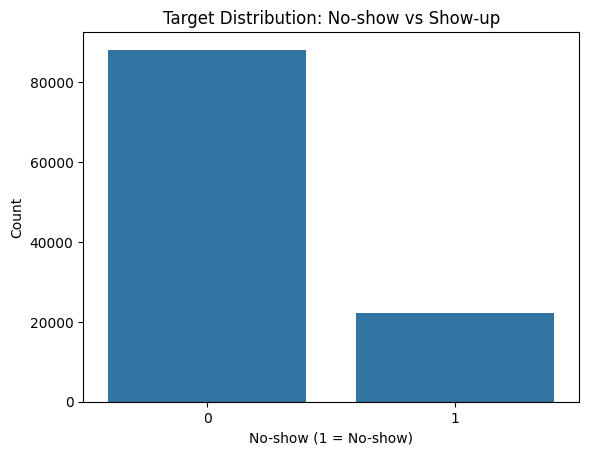

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(x="no_show", data=df)
plt.title("Target Distribution: No-show vs Show-up")
plt.xlabel("No-show (1 = No-show)")
plt.ylabel("Count")
plt.show()


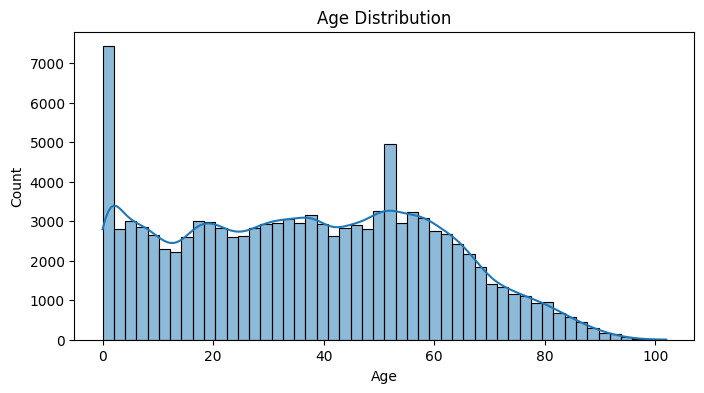

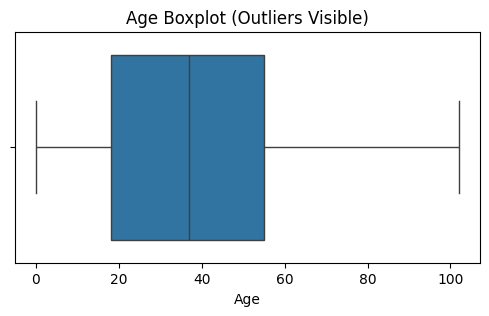

In [30]:
plt.figure(figsize=(8,4))
sns.histplot(df["Age"], bins=50, kde=True)
plt.title("Age Distribution")
plt.xlabel("Age")
plt.show()

plt.figure(figsize=(6,3))
sns.boxplot(x=df["Age"])
plt.title("Age Boxplot (Outliers Visible)")
plt.show()


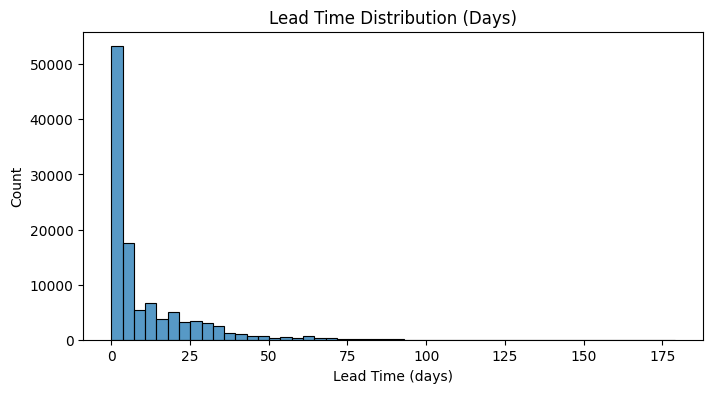

In [31]:
plt.figure(figsize=(8,4))
sns.histplot(df["lead_time_days"], bins=50)
plt.title("Lead Time Distribution (Days)")
plt.xlabel("Lead Time (days)")
plt.show()


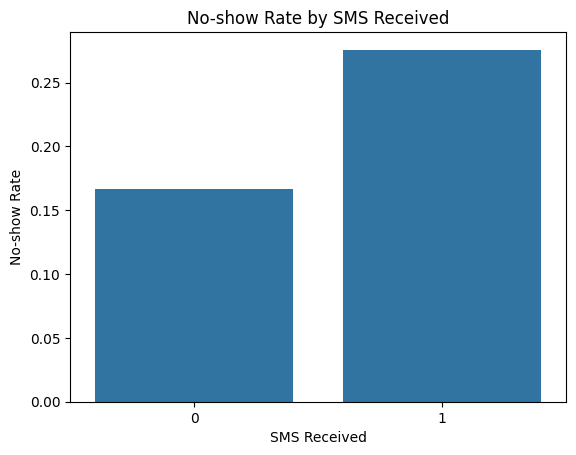

In [32]:
sms_rates = df.groupby("SMS_received")["no_show"].mean().reset_index()

sns.barplot(x="SMS_received", y="no_show", data=sms_rates)
plt.title("No-show Rate by SMS Received")
plt.ylabel("No-show Rate")
plt.xlabel("SMS Received")
plt.show()


/tmp/ipython-input-3656482627.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bucket_rates = df.groupby("lead_bucket")["no_show"].mean().reset_index()


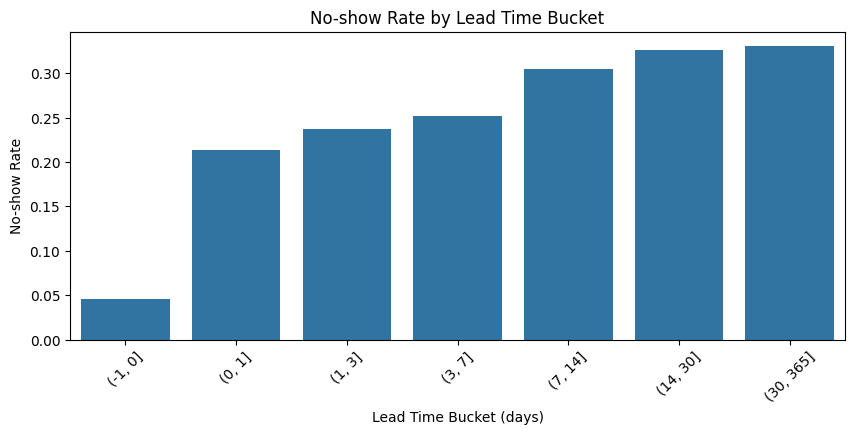

In [33]:
df["lead_bucket"] = pd.cut(
    df["lead_time_days"],
    bins=[-1,0,1,3,7,14,30,365]
)

bucket_rates = df.groupby("lead_bucket")["no_show"].mean().reset_index()

plt.figure(figsize=(10,4))
sns.barplot(x="lead_bucket", y="no_show", data=bucket_rates)
plt.xticks(rotation=45)
plt.title("No-show Rate by Lead Time Bucket")
plt.ylabel("No-show Rate")
plt.xlabel("Lead Time Bucket (days)")
plt.show()


In [34]:
import pandas as pd
import numpy as np

# 1) Load
df = pd.read_csv("/content/appointments.csv")

# 2) Target: 1 = no-show
df["no_show"] = (df["No-show"].str.strip().str.lower() == "yes").astype(int)
print("No-show rate (raw):", df["no_show"].mean())

# 3) Parse datetimes
df["ScheduledDay"] = pd.to_datetime(df["ScheduledDay"], utc=True, errors="coerce")
df["AppointmentDay"] = pd.to_datetime(df["AppointmentDay"], utc=True, errors="coerce")
print("NaT ScheduledDay:", df["ScheduledDay"].isna().sum())
print("NaT AppointmentDay:", df["AppointmentDay"].isna().sum())

# 4) Lead time computed using DATE difference (prevents negative artifacts due to AppointmentDay midnight)
sched_date = df["ScheduledDay"].dt.date
appt_date = df["AppointmentDay"].dt.date
df["lead_time_days"] = (pd.to_datetime(appt_date) - pd.to_datetime(sched_date)).dt.days

print("Lead time (date-based) summary:")
print(df["lead_time_days"].describe())
print("Negative lead times (should be 0 or very small):", (df["lead_time_days"] < 0).sum())

print("Shape after cleaning:", df.shape)


No-show rate (raw): 0.20193255946510807
NaT ScheduledDay: 0
NaT AppointmentDay: 0
Lead time (date-based) summary:
count    110527.000000
mean         10.183702
std          15.254996
min          -6.000000
25%           0.000000
50%           4.000000
75%          15.000000
max         179.000000
Name: lead_time_days, dtype: float64
Negative lead times (should be 0 or very small): 5
Shape after cleaning: (110527, 16)


In [16]:
before = df.shape[0]

# Clean invalid ages (your output showed only Age=115 occurs 5 times)
df = df[(df["Age"] >= 0) & (df["Age"] <= 110)].copy()

# If any negative lead times remain after date-based calculation, drop them as true data errors
neg_lead = (df["lead_time_days"] < 0).sum()
if neg_lead > 0:
    df = df[df["lead_time_days"] >= 0].copy()

after = df.shape[0]

print("Rows removed:", before - after)
print("Cleaned shape:", df.shape)
print("No-show rate (cleaned):", df["no_show"].mean())
print("Negative lead times after cleaning:", (df["lead_time_days"] < 0).sum())
print("Max age after cleaning:", df["Age"].max())


Rows removed: 11
Cleaned shape: (110516, 16)
No-show rate (cleaned): 0.20188027073003004
Negative lead times after cleaning: 0
Max age after cleaning: 102


### Time-Based Scheduling Features

**Intuition**
- Longer wait times increase the likelihood that patients forget or deprioritize appointments.
- Same-day appointments typically indicate higher urgency or commitment.
- Day-of-week and time-of-day may reflect work schedules and accessibility.

### Health and Demographic Features

**Intuition**
- Chronic conditions and disabilities may affect a patient’s ability to attend appointments.
- Welfare status may correlate with access barriers.
- Neighborhood captures geographic and socioeconomic factors.



In [17]:
# Time-based features
df["is_same_day"] = (df["lead_time_days"] == 0).astype(int)
df["appt_dow"] = df["AppointmentDay"].dt.dayofweek.astype(int)     # 0=Mon
df["appt_month"] = df["AppointmentDay"].dt.month.astype(int)
df["scheduled_dow"] = df["ScheduledDay"].dt.dayofweek.astype(int)
df["scheduled_hour"] = df["ScheduledDay"].dt.hour.astype(int)

# Health composites
df["has_chronic"] = ((df["Hypertension"] == 1) | (df["Diabetes"] == 1)).astype(int)
df["comorbidity_count"] = df["Hypertension"] + df["Diabetes"] + df["Alcoholism"]
df["has_disability"] = (df["Handicapped"] > 0).astype(int)

# Quick sanity checks
print("Neighbourhood nunique:", df["Neighbourhood"].nunique())
print("Handicapped values:", sorted(df["Handicapped"].unique())[:10], "... max:", df["Handicapped"].max())
print("Lead time min/max:", df["lead_time_days"].min(), df["lead_time_days"].max())
print("scheduled_hour min/max:", df["scheduled_hour"].min(), df["scheduled_hour"].max())

# Small table: no-show rate by a few engineered features
summary = df.groupby("is_same_day")["no_show"].mean().rename("no_show_rate")
print("\nNo-show rate by is_same_day:")
print(summary)

print("\nNo-show rate by SMS_received:")
print(df.groupby("SMS_received")["no_show"].mean())

print("\nNo-show rate by lead_time_days bucket:")
df["lead_bucket"] = pd.cut(df["lead_time_days"], bins=[-1,0,1,3,7,14,30,365,9999])
print(df.groupby("lead_bucket")["no_show"].mean())


Neighbourhood nunique: 81
Handicapped values: [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4)] ... max: 4
Lead time min/max: 0 179
scheduled_hour min/max: 6 21

No-show rate by is_same_day:
is_same_day
0    0.285164
1    0.046472
Name: no_show_rate, dtype: float64

No-show rate by SMS_received:
SMS_received
0    0.166949
1    0.275753
Name: no_show, dtype: float64

No-show rate by lead_time_days bucket:
lead_bucket
(-1, 0]        0.046472
(0, 1]         0.213505
(1, 3]         0.237209
(3, 7]         0.252027
(7, 14]        0.304699
(14, 30]       0.325907
(30, 365]      0.329960
(365, 9999]         NaN
Name: no_show, dtype: float64


/tmp/ipython-input-1643024217.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(df.groupby("lead_bucket")["no_show"].mean())


Sanity checks confirmed:
- Neighbourhood has ~80 unique values (manageable for OHE)
- Handicapped ranges from 0–4 and was treated as ordinal
- Lead time ranges from 0–179 days after cleaning
- Scheduled hour spans typical clinic hours

### Leakage Prevention

- Identifier columns (`PatientId`, `AppointmentID`) are excluded from modeling.
- All features are derived from information available at scheduling time.
- No patient-history or post-appointment features are used.


In [18]:
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline

# Drop identifiers + original target label string column
# (Keep engineered features we created)
drop_cols = ["No-show", "PatientId", "AppointmentID"]

# Features (leakage-safe)
categorical = ["Gender", "Neighbourhood", "appt_dow", "appt_month", "scheduled_dow"]
numeric = ["Age", "lead_time_days", "scheduled_hour", "Handicapped", "comorbidity_count"]
binary = [
    "OnGovtWelfareBenefits", "Hypertension", "Diabetes", "Alcoholism",
    "SMS_received", "has_chronic", "has_disability", "is_same_day"
]

feature_cols = categorical + numeric + binary

X = df[feature_cols].copy()
y = df["no_show"].copy()

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

preprocess = ColumnTransformer(
    transformers=[
        ("cat", OneHotEncoder(handle_unknown="ignore"), categorical),
        ("num", StandardScaler(), numeric),
        ("bin", "passthrough", binary),
    ],
    remainder="drop"
)

print("Train no-show rate:", y_train.mean(), "Test no-show rate:", y_test.mean())
print("X_train shape:", X_train.shape, "X_test shape:", X_test.shape)


Train no-show rate: 0.20188435958919604 Test no-show rate: 0.20186391603329715
X_train shape: (88412, 18) X_test shape: (22104, 18)


In [19]:
from sklearn.linear_model import LogisticRegression

logreg = Pipeline(steps=[
    ("preprocess", preprocess),
    ("model", LogisticRegression(
        max_iter=3000,
        class_weight="balanced",
        solver="lbfgs"
    ))
])

logreg.fit(X_train, y_train)
print("LogReg trained.")


LogReg trained.


In [20]:
!pip -q install xgboost


In [21]:
try:
    import xgboost as xgb
    gbm_model = xgb.XGBClassifier(
        n_estimators=500,
        learning_rate=0.05,
        max_depth=4,
        subsample=0.9,
        colsample_bytree=0.9,
        reg_lambda=1.0,
        min_child_weight=1,
        objective="binary:logistic",
        eval_metric="auc",
        random_state=42,
        n_jobs=-1
    )
    gbm = Pipeline(steps=[("preprocess", preprocess), ("model", gbm_model)])
    model_used = "xgboost"
except Exception as e:
    from sklearn.ensemble import HistGradientBoostingClassifier
    gbm_model = HistGradientBoostingClassifier(
        max_depth=6,
        learning_rate=0.06,
        max_iter=400,
        random_state=42
    )
    gbm = Pipeline(steps=[("preprocess", preprocess), ("model", gbm_model)])
    model_used = "hist_gradient_boosting"
    print("XGBoost not available, fallback used:", e)

gbm.fit(X_train, y_train)
print("GBM trained:", model_used)


GBM trained: xgboost


In [22]:
import numpy as np
from sklearn.metrics import roc_auc_score, precision_recall_fscore_support

def eval_model(model, X, y, name, threshold=0.5):
    proba = model.predict_proba(X)[:, 1]
    preds = (proba >= threshold).astype(int)
    auc = roc_auc_score(y, proba)
    precision, recall, f1, _ = precision_recall_fscore_support(
        y, preds, average="binary", zero_division=0
    )
    print(f"{name} @thr={threshold:.2f} | AUC={auc:.4f} P={precision:.4f} R={recall:.4f} F1={f1:.4f}")
    return proba

proba_lr = eval_model(logreg, X_test, y_test, "LogReg", threshold=0.5)
proba_gbm = eval_model(gbm, X_test, y_test, f"GBM({model_used})", threshold=0.5)


LogReg @thr=0.50 | AUC=0.7206 P=0.3001 R=0.8541 F1=0.4442
GBM(xgboost) @thr=0.50 | AUC=0.7411 P=0.5391 R=0.0294 F1=0.0557


In [23]:
def top_k_hit_rate(y_true, proba, k=100):
    idx = np.argsort(-proba)[:k]
    hits = int(y_true.iloc[idx].sum())
    return hits, hits / k

k = 100
hits_lr, rate_lr = top_k_hit_rate(y_test, proba_lr, k)
hits_gbm, rate_gbm = top_k_hit_rate(y_test, proba_gbm, k)

print(f"Baseline no-show rate: {y_test.mean():.2%}")
print(f"Top {k} calls/day LogReg: {rate_lr:.2%} hit-rate ({hits_lr}/{k} no-shows captured)")
print(f"Top {k} calls/day GBM:    {rate_gbm:.2%} hit-rate ({hits_gbm}/{k} no-shows captured)")


Baseline no-show rate: 20.19%
Top 100 calls/day LogReg: 39.00% hit-rate (39/100 no-shows captured)
Top 100 calls/day GBM:    59.00% hit-rate (59/100 no-shows captured)


,0
is_same_day,0.169089
lead_time_days,0.090277
SMS_received,0.017998
Neighbourhood_SANTOS DUMONT,0.017719
Age,0.017068
Neighbourhood_ITARARÉ,0.016648
Neighbourhood_GURIGICA,0.013622
Neighbourhood_SANTO ANDRÉ,0.012213
Neighbourhood_JARDIM DA PENHA,0.012091
OnGovtWelfareBenefits,0.011996


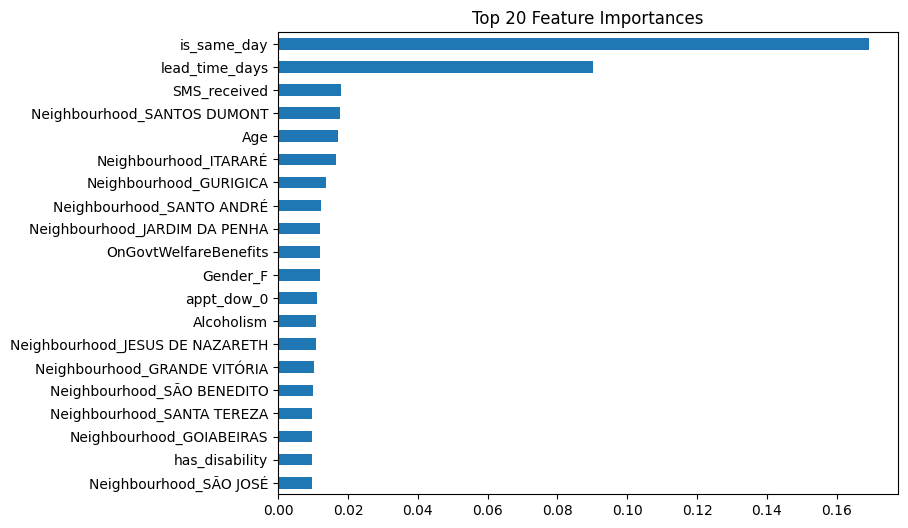

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Extract feature names after preprocessing
ohe = gbm.named_steps["preprocess"].named_transformers_["cat"]
cat_feature_names = list(ohe.get_feature_names_out(categorical))
feature_names = cat_feature_names + numeric + binary

model = gbm.named_steps["model"]

if model_used == "xgboost":
    importances = model.feature_importances_
    imp = pd.Series(importances, index=feature_names).sort_values(ascending=False).head(20)
else:
    from sklearn.inspection import permutation_importance
    X_test_t = gbm.named_steps["preprocess"].transform(X_test)
    r = permutation_importance(model, X_test_t, y_test, n_repeats=5, random_state=42, scoring="roc_auc")
    imp = pd.Series(r.importances_mean, index=feature_names).sort_values(ascending=False).head(20)

display(imp)

imp.sort_values().plot(kind="barh", figsize=(8,6))
plt.title("Top 20 Feature Importances")
plt.show()


In [25]:
from sklearn.metrics import f1_score

def best_f1_threshold(y_true, proba):
    thresholds = np.linspace(0.01, 0.99, 99)
    best_t, best_f1 = None, -1
    for t in thresholds:
        preds = (proba >= t).astype(int)
        f1 = f1_score(y_true, preds)
        if f1 > best_f1:
            best_f1, best_t = f1, t
    return best_t, best_f1

t_lr, f1_lr = best_f1_threshold(y_test, proba_lr)
t_gbm, f1_gbm = best_f1_threshold(y_test, proba_gbm)

print("Best F1 threshold LogReg:", t_lr, "F1:", f1_lr)
print("Best F1 threshold GBM:", t_gbm, "F1:", f1_gbm)


Best F1 threshold LogReg: 0.53 F1: 0.4454323461273558
Best F1 threshold GBM: 0.21000000000000002 F1: 0.45408716737923555


In [26]:
from sklearn.metrics import precision_recall_fscore_support, roc_auc_score

def eval_at_top_k(y_true, proba, k=100, name="model"):
    # threshold = the kth highest probability
    thresh = np.sort(proba)[-k]
    preds = (proba >= thresh).astype(int)

    precision, recall, f1, _ = precision_recall_fscore_support(
        y_true, preds, average="binary", zero_division=0
    )
    auc = roc_auc_score(y_true, proba)

    print(f"{name} (Top {k} flagged) | AUC={auc:.4f} P={precision:.4f} R={recall:.4f} F1={f1:.4f} | threshold≈{thresh:.4f}")

eval_at_top_k(y_test, proba_lr, k=100, name="LogReg")
eval_at_top_k(y_test, proba_gbm, k=100, name=f"GBM({model_used})")


LogReg (Top 100 flagged) | AUC=0.7206 P=0.3900 R=0.0087 F1=0.0171 | threshold≈0.7900
GBM(xgboost) (Top 100 flagged) | AUC=0.7411 P=0.5900 R=0.0132 F1=0.0259 | threshold≈0.5356


In [27]:
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import roc_auc_score

# Calibrate the already-trained pipeline (gbm) using sigmoid calibration
calibrated_gbm = CalibratedClassifierCV(gbm, method="sigmoid", cv=3)
calibrated_gbm.fit(X_train, y_train)

proba_cal = calibrated_gbm.predict_proba(X_test)[:, 1]
print("Calibrated GBM AUC:", roc_auc_score(y_test, proba_cal))


Calibrated GBM AUC: 0.7410512005522862


In [28]:
from sklearn.metrics import f1_score
import numpy as np

def best_f1_threshold(y_true, proba):
    thresholds = np.linspace(0.01, 0.99, 99)
    best_t, best_f1 = None, -1
    for t in thresholds:
        preds = (proba >= t).astype(int)
        f1 = f1_score(y_true, preds)
        if f1 > best_f1:
            best_f1, best_t = f1, t
    return best_t, best_f1

t_cal, f1_cal = best_f1_threshold(y_test, proba_cal)
print("Best F1 threshold calibrated GBM:", t_cal, "F1:", f1_cal)


Best F1 threshold calibrated GBM: 0.18000000000000002 F1: 0.4540084388185654
